In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [2]:
from fastai.vision import *
from fastai.callbacks import *
from fastai.vision.gan import *
from tqdm.notebook import tqdm
from utils.torch_gmm import torch_gmm
from torch.cuda.amp import GradScaler
import wandb
from wandb.fastai import WandbCallback
wandb.init(project="poke-gan",name='msg-gp-512-cont-2')

wandb: Wandb version 0.9.1 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


W&B Run: https://app.wandb.ai/atom-101/poke-gan/runs/jtph70w4

In [3]:
_conv_args = dict(leaky=0.2, norm_type=NormType.Spectral)
def conv_layer(ni:int, nf:int, ks:int=3, stride:int=1, padding:int=None, bias:bool=None, is_1d:bool=False,
               norm_type:Optional[NormType]=NormType.Batch,  use_activ:bool=True, leaky:float=None,
               transpose:bool=False, init:Callable=nn.init.kaiming_normal_, self_attention:bool=False,dilation=1):
    "Create a sequence of convolutional (`ni` to `nf`), ReLU (if `use_activ`) and batchnorm (if `bn`) layers."
    if padding is None: padding = (ks-1)//2 if not transpose else 0
    bn = norm_type in (NormType.Batch, NormType.BatchZero)
    if bias is None: bias = not bn
    conv_func = nn.ConvTranspose2d if transpose else nn.Conv1d if is_1d else nn.Conv2d
    conv = init_default(conv_func(ni, nf, kernel_size=ks, bias=bias, stride=stride, padding=padding,dilation=dilation), init)
    if   norm_type==NormType.Weight:   conv = weight_norm(conv)
    elif norm_type==NormType.Spectral: conv = spectral_norm(conv)
    layers = [conv]
    if use_activ: layers.append(relu(True, leaky=leaky))
    if bn: layers.append((nn.BatchNorm1d if is_1d else nn.BatchNorm2d)(nf))
    if self_attention: layers.append(SelfAttention(nf))
    return nn.Sequential(*layers)
def _conv(ni:int, nf:int, ks:int=3, stride:int=1, **kwargs):
    return conv_layer(ni, nf, ks=ks, stride=stride, **_conv_args, **kwargs)
class ResBlock(nn.Module):
    def __init__(self,ni,nm,nf,ks=3,skip=True):
        super().__init__()
        self.conv = nn.Sequential(*[_conv(ni, nm, ks=ks),
                    _conv(nm, nf, ks=ks)])
        self.skip = _conv(ni,nf,ks=1) if skip else None
    def forward(self,x):
        if self.skip is not None:
            return self.conv(x)+self.skip(x)
        else:
            return self.conv(x)

class Critic(nn.Module):
    def __init__(self,n_channels:int=3,nf:int=32,MSG=False):
        "Critic to train a `GAN`."
        super().__init__()
        self.conv1 = nn.Sequential(*[
            _conv(n_channels, nf, ks=5, stride=2),
            _conv(nf, nf*2, ks=5),]) #256
        nf = nf*2+3 if MSG else nf*2 # nf=64
        self.conv2 = nn.Sequential(*[ResBlock(nf, nf, nf,skip=False),
                                     nn.AvgPool2d(2)]) #128
        nf = nf+3 if MSG else nf
        self.conv3 = nn.Sequential(*[ResBlock(nf,nf,nf*2,skip=False),
                                     nn.AvgPool2d(2)]) #64
        nf = nf*2 # nf=128 + 12
        self.conv4 = nn.Sequential(*[ResBlock(nf,nf,int(nf*1.5),skip=False), #nf=192
                                     nn.AvgPool2d(2)]) #32
        nf = int(nf*1.5)+3 if MSG else int(nf*1.5)
        self.conv5 = nn.Sequential(*[_conv(nf, int(nf*1.5), ks=3, self_attention=True), #nf=288
                                     _conv(int(nf*1.5), int(nf*1.5*1.25), ks=3, stride=2), #nf=360
                                     nn.AvgPool2d(2)]) #8
        nf = int(nf*1.5*1.25)
        self.head = nn.Sequential(*[_conv(nf, nf, ks=3, stride=2), #4
                                     _conv(nf, nf, ks=4, padding=0), #1
                                     Flatten(),
                                     nn.Linear(nf,1)])
        self.MSG=MSG
    def forward(self,x):
        if self.MSG:
            x1 = self.conv1(x[-1])
            x1 = torch.cat([x[-2],x1],dim=1) #256
            x1 = self.conv2(x1)
            x1 = torch.cat([x[-3],x1],dim=1) #128
            x1 = self.conv3(x1)
            x1 = self.conv4(x1)
            x1 = torch.cat([x[-4],x1],dim=1) #32
            x1 = self.conv5(x1)
            x1 = self.head(x1)
            return x1
        else:
            return self.head(self.conv5(self.conv4(self.conv3(self.conv2(self.conv1(x))))))
        
class M8_512(nn.Module):
    def __init__(self,msg=False):
        super().__init__()
        ''' 512 latent '''
        self.initial = nn.Sequential(
            conv_layer(128,256,ks=3,leaky=0.2,norm_type=NormType.Batch),
            conv_layer(256,512,ks=3,leaky=0.2,norm_type=NormType.Batch))
        self.first_block = nn.Sequential( #16x16
            conv_layer(512,256,ks=5,leaky=0.2,norm_type=NormType.Batch),
            conv_layer(256,128,ks=5,leaky=0.2,norm_type=NormType.Batch),
            conv_layer(128,64,ks=5,leaky=0.2,norm_type=NormType.Batch),)
        self.second_block = nn.Sequential( #128x128
            nn.Sequential(*conv_layer(64,32,ks=5,leaky=0.2,norm_type=NormType.Batch,dilation=2,padding=4),
                          *conv_layer(32,48,ks=5,leaky=0.2,norm_type=NormType.Batch)),
            nn.Sequential(*conv_layer(48,24,ks=5,leaky=0.2,norm_type=NormType.Batch,dilation=4,padding=8),
                          *conv_layer(24,32,ks=5,leaky=0.2,norm_type=NormType.Batch,dilation=2,padding=4)))
        self.final = conv_layer(32,3,ks=5,use_activ=False,norm_type=NormType.Batch)
        self.tanh = nn.Tanh()
        self.trgb = nn.Sequential(
            conv_layer(128,3,ks=1,use_activ=False,norm_type=None), #32
            conv_layer(48,3,ks=1,use_activ=False,norm_type=None), #128
            conv_layer(32,3,ks=1,use_activ=False,norm_type=None),) #256
        self.blur1,self.pad1 = nn.AvgPool2d(2,1),nn.ReplicationPad2d((0,1,0,1))
        self.blur2,self.pad2 = nn.AvgPool2d(4,1),nn.ReplicationPad2d((1,2,1,2))
        self.init_pad = nn.ReplicationPad2d((1,1,1,1))
        self.msg = msg
    def forward(self,x):
        x = self.init_pad(x.view(-1,128,2,2))
        trgb = []
        for l in self.initial:
            x = l(x)
            x = F.interpolate(x,scale_factor=2,mode='bilinear',align_corners=True)
        for i,l in enumerate(self.first_block):
            x = l(x)
            if i==2: x = self.blur1(self.pad1(x)) #64,64
            # if self.training and i==1: # 32x32
            if self.msg and self.training and i==1: # 32x32
                trgb.append(self.tanh(self.trgb[0](x)))
            x = F.interpolate(x,scale_factor=2,mode='bilinear',align_corners=True)                            
        for i,l in enumerate(self.second_block):
            x = l(x)
            if i==0: x = self.blur1(self.pad1(x))
            if i==1: x = self.blur2(self.pad2(x))
            # if self.training:
            if self.msg and self.training:
                trgb.append(self.tanh(self.trgb[i+1](x)))
            x = F.interpolate(x,scale_factor=2,mode='bilinear',align_corners=True)
        x = self.final(x)
        # return trgb + [self.tanh(x)] if self.training else self.tanh(x)
        return trgb + [self.tanh(x)] if self.msg and self.training else self.tanh(x)    

In [5]:
PATH = Path('../../Data/PokeDataset/')
scaler = GradScaler()
def grad_penalty(crit, real, fake, lamda=10, MSG=False, scale=False):
    if MSG: 
        bs = real[-1].shape[0]
        eps = torch.rand((bs,1,1,1)).cuda()
        merged = [eps*real[i] + (1-eps)*fake[i] for i in range(len(real))]
        for m in merged: m.requires_grad=True
        if scale: op = scaler.scale(crit(merged))
        scaled_grads = [torch.autograd.grad(outputs=op,inputs=m,grad_outputs=torch.ones_like(op),
                                     create_graph=True,retain_graph=True,only_inputs=True)[0] 
                 for m in merged]
        inv_scale = 1./scaler.get_scale()
        if scale: 
            grads = [g.view(bs,-1)*inv_scale for g in scaled_grads]
        else:
            grads = [g.view(bs,-1) for g in scaled_grads]
        penalty = [lamda*((g.norm(2,dim=1) - 1)**2).mean() for g in grads]
        return torch.stack(penalty).mean()
    else:
        bs = real.shape[0]
        eps = torch.rand((bs,1,1,1)).cuda().expand_as(real)
        merged = eps*real + (1-eps)*fake
        merged.requires_grad=True
        op = crit(merged)
        grads = torch.autograd.grad(outputs=op,inputs=merged,grad_outputs=torch.ones_like(op).cuda(),
                                     create_graph=True,retain_graph=True,only_inputs=True)[0] 
        grads = grads.view(bs,-1)
        penalty = lamda*((grads.norm(2,dim=1) - 1)**2).mean()
        return penalty  
    
    
       
filt = pd.read_csv('Pokemons.csv',header=None).values        
data = (ImageList.from_folder(PATH)
#         .filter_by_func(lambda x: '1_Danbooru2019_Pokemon' not in str(x) and '2_Fire_Old' not in str(x))
#         .filter_by_func(lambda x: any([f[0] in str(x) for f in filt]))
        .split_none()
        .label_const()
        .transform(get_transforms(max_lighting=None),size=512)
        .databunch(bs=16)
        .normalize(stats = [torch.tensor([0.5,0.5,0.5]), torch.tensor([0.5,0.5,0.5])]))
# data.train_dl = data.train_dl.new(shuffle=False)

MSG = True
gen = M8_512(MSG)
crit = Critic(MSG=MSG).cuda()
gen.train().cuda()
gen.load_state_dict(torch.load('512-latent/msg-gp-gen-10ep.pkl'))
crit.load_state_dict(torch.load('512-latent/msg-gp-crit-10ep.pkl'))
opt_crit = torch.optim.Adam(crit.parameters(),lr=4e-5,betas=(0,0.9))
opt_gen = torch.optim.Adam(gen.parameters(),lr=1e-5,betas=(0,0.9))
epochs = 10
import pickle
from sklearn.mixture import GaussianMixture
gmm = pickle.load(open('512-latent/GMM.pkl','rb'))
gmm = torch_gmm(gmm)
# fixed_latent = gmm.sample(8).cuda().reshape(-1,512,1,1)
fixed_latent = torch.Tensor(np.load('512-latent/fixed_latent.npy')).cuda().reshape(-1,512,1,1)

wandb: Wandb version 0.9.1 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


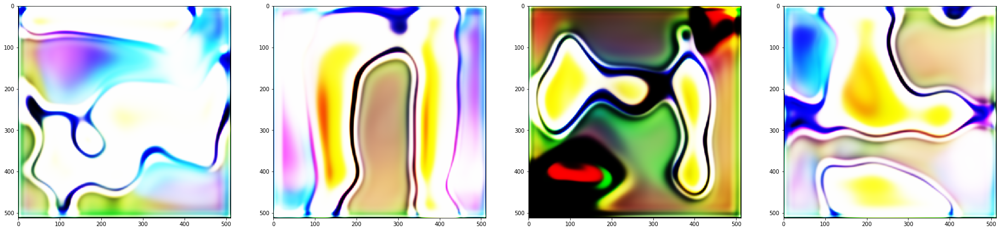

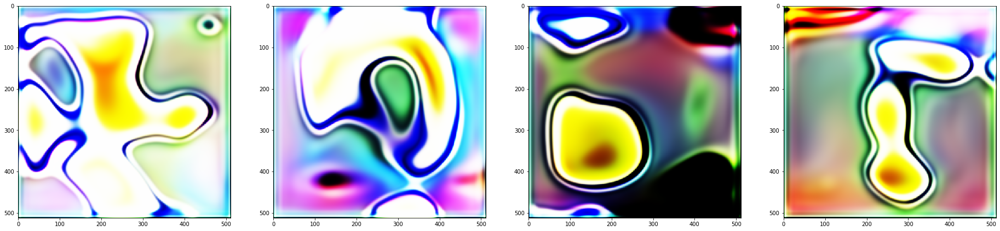

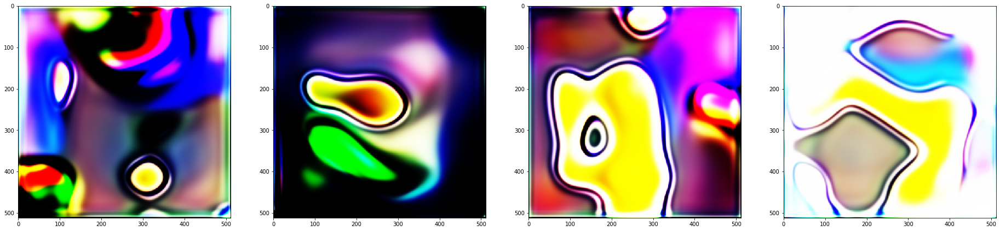

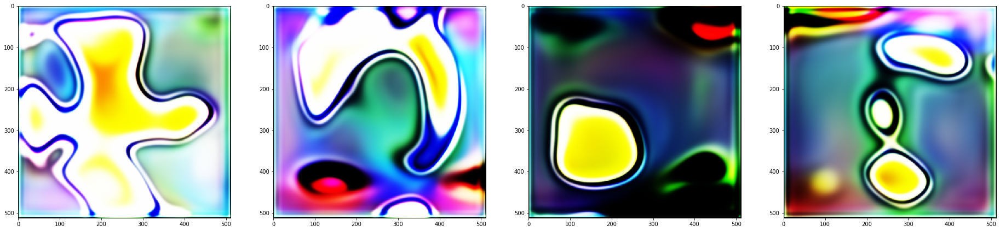

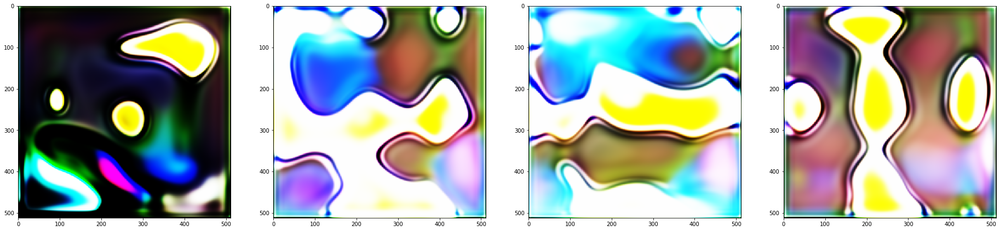

...

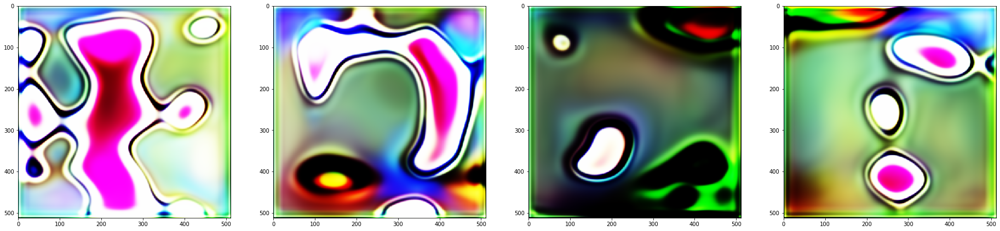

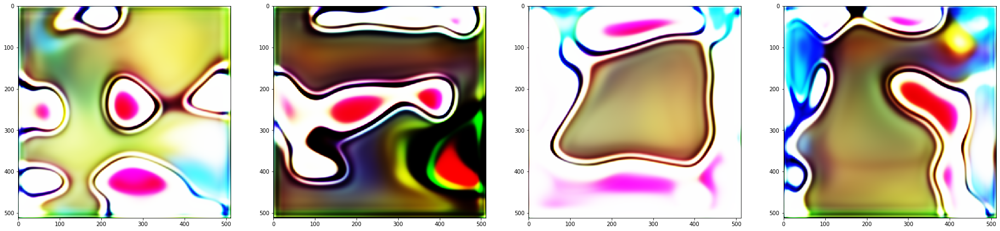

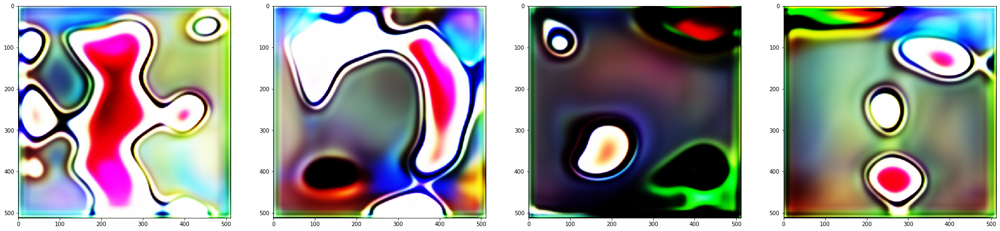

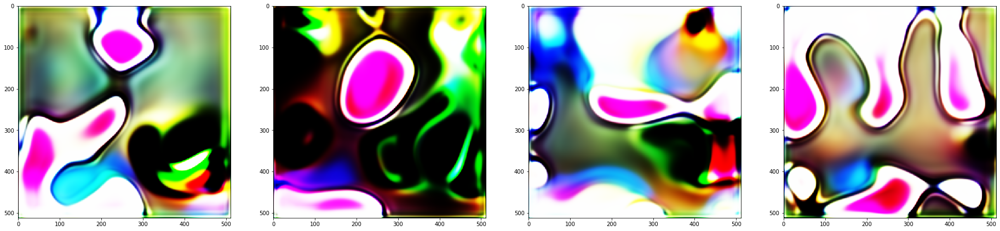

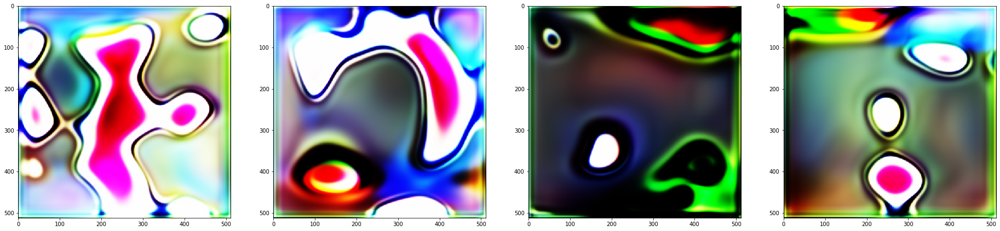

In [ ]:
%matplotlib inline
k=5
scale=True # use fp16 or not
for epoch in range(epochs):
    loop = tqdm(data.train_dl)
    for i,(xb,_) in enumerate(loop):
        opt_crit.zero_grad()
        gen.eval()
        crit.train()
        bs = xb.shape[0]
        xb = [F.interpolate(xb,scale_factor=1/2**i) for i in [4,2,1,0]]  
        noise = gmm.sample(bs).cuda().reshape(-1,512,1,1)
        crit_loss_real = -crit(xb).mean()
        if scale:
            scaler.scale(crit_loss_real).backward()
        else:
            crit_loss_real.backward()
        with torch.no_grad():
            fake = gen(noise).detach()
        fake = [F.interpolate(fake,scale_factor=1/2**i) for i in [4,2,1,0]]
        crit_loss_fake = crit(fake).mean()
        if scale:
            scaler.scale(crit_loss_fake).backward()
        else:
            crit_loss_fake.backward()
        gp = grad_penalty(crit,xb,fake,MSG=MSG,scale=scale)
        if scale:
            scaler.scale(gp).backward()
            scaler.step(opt_crit)
            scaler.update()
        else:
            gp.backward()
            opt_crit.step()
        if i%k==k-1: # update generator every k critic steps
            opt_gen.zero_grad()
            for p in crit.parameters():
                p.requires_grad = False 
            gen.train()
            noise = gmm.sample(bs).cuda().reshape(-1,512,1,1)
            fake = gen(noise)
            gen_loss = -crit(fake).mean()
            if scale:
                scaler.scale(gen_loss).backward()
                scaler.step(opt_gen)
                scaler.update()
            else:
                gen_loss.backward()
                opt_gen.step()
            for p in crit.parameters():
                p.requires_grad = True
            gen.eval()
        loop.set_description(f'Epoch {epoch+1}/{epochs}')
        try: loop.set_postfix(crit=(crit_loss_real+crit_loss_fake).item(),gen=gen_loss.item(),gp=gp.item())
        except: loop.set_postfix(crit=(crit_loss_real+crit_loss_fake).item(),gp=gp.item())
        if i%200==199:
            op_gen = (fake[-1]+1)/2 if MSG else (fake+1)/2
            fig,ax = plt.subplots(1,4)
            fig.set_figwidth(32)
            fig.set_figheight(8)
            # plot random image
            for j in range(4):
                ax[j].imshow(op_gen[2*j].permute(1,2,0).detach().cpu().numpy())
            wandb.log({'plots':fig,'epoch':epoch})
            fake = gen(fixed_latent)
            op_gen = (fake+1)/2
            fig,ax = plt.subplots(1,4)
            fig.set_figwidth(32)
            fig.set_figheight(8)
            # plot the fixed latent
            for j in range(4):
                ax[j].imshow(op_gen[2*j].permute(1,2,0).detach().cpu().numpy())
            wandb.log({'fixed':fig,'epoch':epoch})
            if i%2000==1999: plt.show()
            plt.close('all')
            torch.save(gen.state_dict(),'512-latent/msg-gp-gen.pkl')
            torch.save(crit.state_dict(),'512-latent/msg-gp-crit.pkl')
    torch.save(gen.state_dict(),f'512-latent/msg-gp-gen-{11+epoch}ep.pkl')
    torch.save(crit.state_dict(),f'512-latent/msg-gp-crit-{11+epoch}ep.pkl')
    # let the crit stabilize, reduce k over time
    k = k-1 if k>1 else k

In [13]:
np.save('512-latent/fixed_latent.npy',fixed_latent.cpu().numpy())